In [1]:
!unzip /content/dataset.zip

Archive:  /content/dataset.zip
  inflating: data/train/ben_afflek/httpcsvkmeuaeccjpg.jpg  
  inflating: data/train/ben_afflek/httpimagesfandangocomrImageRendererredesignstaticimgnoxportraitjpgpcpcpcimagesmasterrepositoryperformerimagespjpg.jpg  
  inflating: data/train/ben_afflek/httpssmediacacheakpinimgcomxdbbdbbbececacdecdcdfjpg.jpg  
  inflating: data/train/ben_afflek/httpssmediacacheakpinimgcomxdfdfadcfeabjpg.jpg  
  inflating: data/train/ben_afflek/httpssmediacacheakpinimgcomxedaedabcbefbcbabbjpg.jpg  
  inflating: data/train/ben_afflek/httpssmediacacheakpinimgcomxeebdfdbaaajpg.jpg  
  inflating: data/train/ben_afflek/httpssmediacacheakpinimgcomxeeedcacddeccccacfjpg.jpg  
  inflating: data/train/ben_afflek/httpsuploadwikimediaorgwikipediacommonsthumbddBenAffleckbyGageSkidmorejpgpxBenAffleckbyGageSkidmorejpg.jpg  
  inflating: data/train/ben_afflek/httptrwebimgacstanetcxbdddmediasnmediajpg.jpg  
  inflating: data/train/ben_afflek/httpwwwaceshowbizcomimagesphotobenaffleckjpg.jpg  
 

In [2]:
pip install face_recognition

     |████████████████████████████████| 100.1 MB 25 kB/s 
  Created wheel for face-recognition-models: filename=face_recognition_models-0.3.0-py2.py3-none-any.whl size=100566186 sha256=aa752e113667c0c90df4bf59539d1cb5017eb87e6e29d15bb3f91d993c95e9b8
  Stored in directory: /root/.cache/pip/wheels/d6/81/3c/884bcd5e1c120ff548d57c2ecc9ebf3281c9a6f7c0e7e7947a
Successfully built face-recognition-models


In [3]:
import cv2
import os
from os import listdir
from google.colab.patches import cv2_imshow
import face_recognition
import numpy as np
from sklearn import metrics
from imutils import build_montages

elton_john
[(86, 145, 176, 56)]


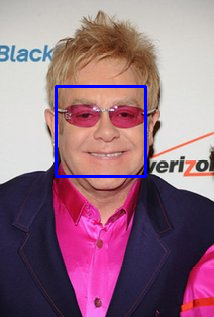

[]


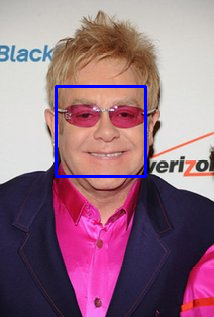

[(63, 237, 138, 162)]


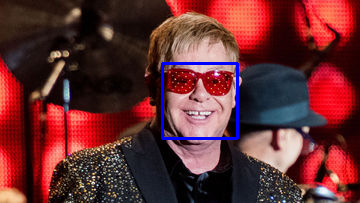

[(78, 105, 114, 69)]


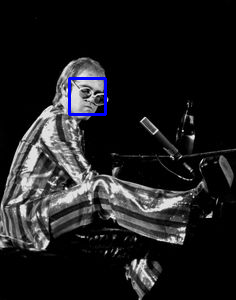

[(66, 121, 129, 59)]


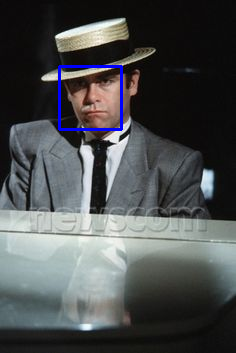

[(67, 210, 196, 81)]


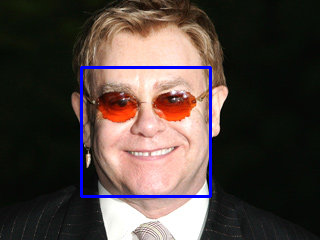

[]


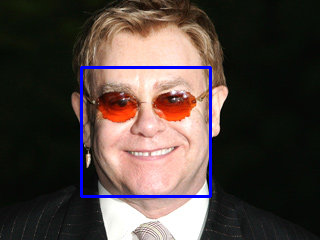

[(46, 185, 136, 96)]


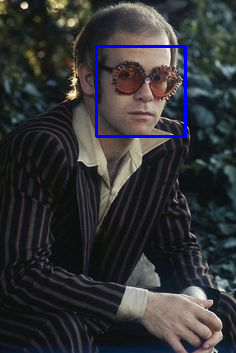

[(32, 163, 140, 55)]


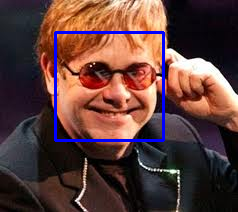

[(14, 212, 88, 137)]


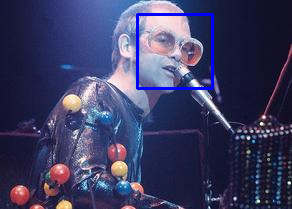

[(38, 152, 90, 101)]


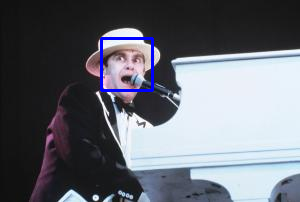

[(26, 155, 116, 66)]


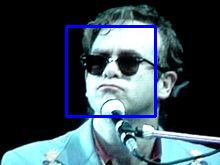

[(56, 199, 163, 91)]


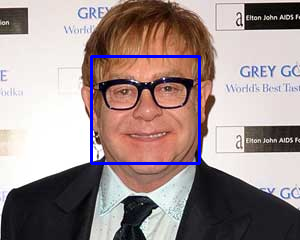

[(67, 167, 196, 38)]


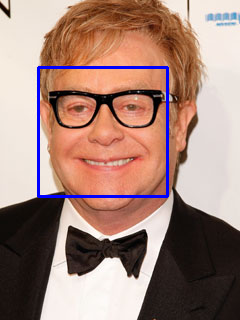

[(53, 170, 115, 107)]


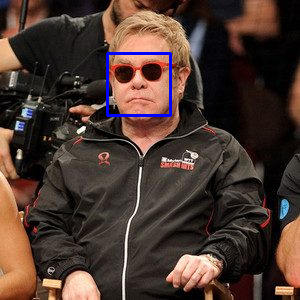

[(41, 117, 84, 74)]


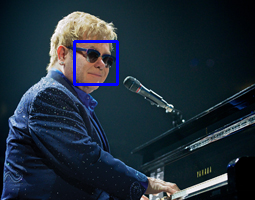

[(46, 195, 136, 106)]


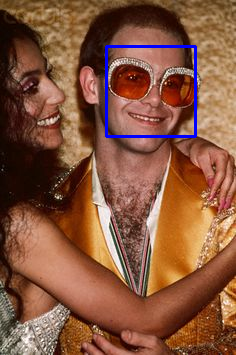

mindy_kaling
[(39, 239, 168, 110)]


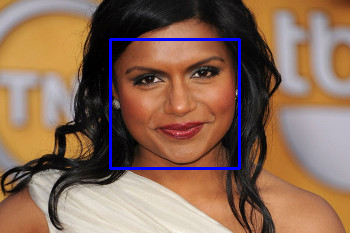

[(96, 210, 225, 81)]


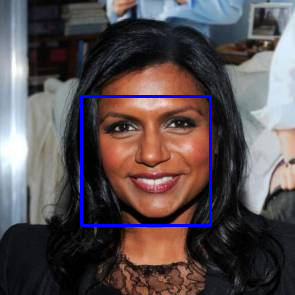

[(82, 196, 211, 67)]


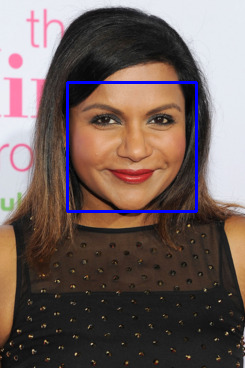

[(87, 156, 149, 93)]


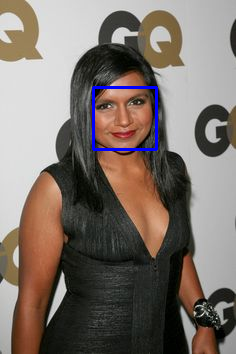

[(34, 129, 70, 93)]


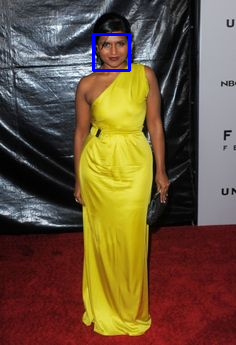

[(59, 149, 122, 87)]


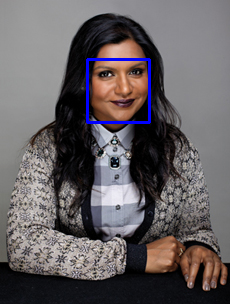

[(34, 125, 70, 89)]


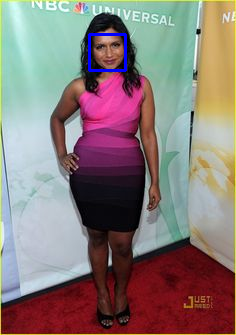

[(53, 196, 182, 67)]


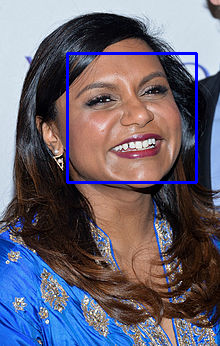

[(53, 210, 182, 81)]


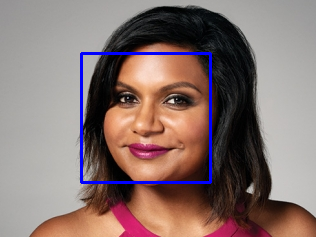

[(11, 107, 73, 45)]


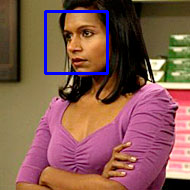

[(63, 137, 138, 63)]


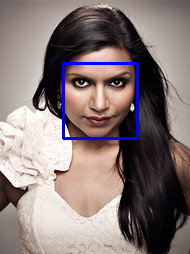

[(86, 135, 176, 46)]


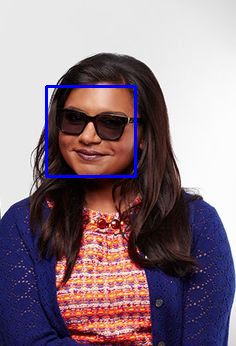

[(80, 223, 187, 115)]


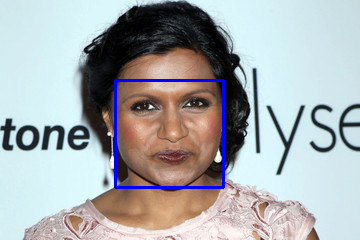

[(67, 225, 196, 96)]


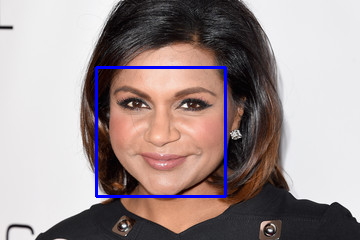

[]


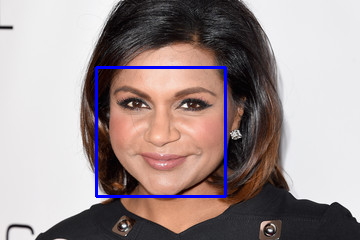

[(38, 187, 113, 113)]


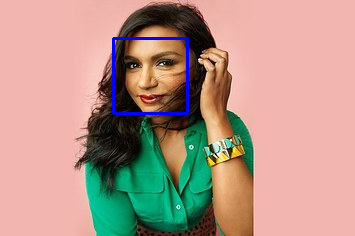

[(55, 179, 130, 104)]


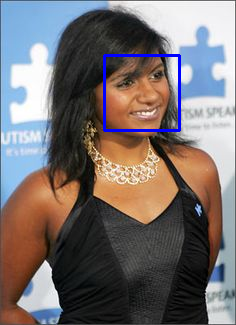

[(66, 225, 156, 135)]


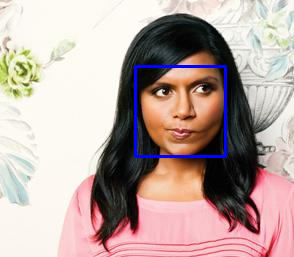

[(68, 187, 175, 79)]


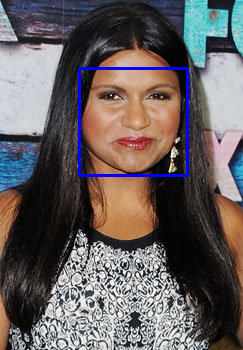

[(26, 125, 62, 89)]


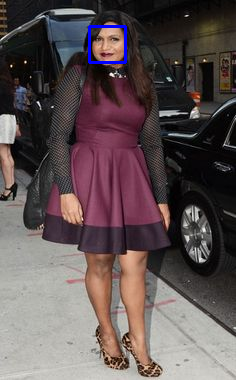

[(72, 154, 146, 79)]


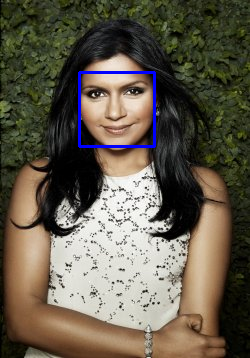

[(46, 170, 108, 107)]


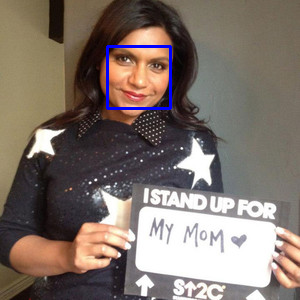

ben_afflek
[(56, 127, 163, 20)]


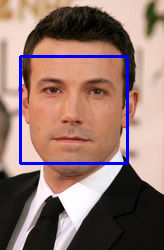

[(39, 170, 101, 107)]


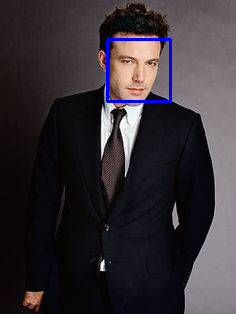

[(46, 126, 136, 36)]


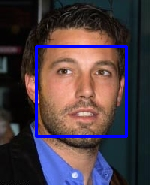

[(67, 187, 118, 135)]


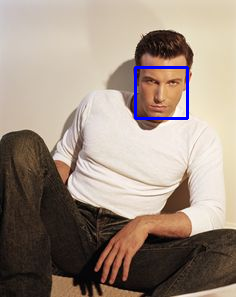

[(82, 196, 211, 67)]


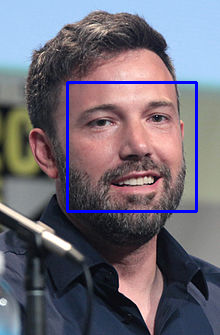

[(38, 79, 113, 5)]


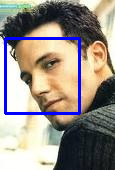

[(67, 139, 196, 10)]


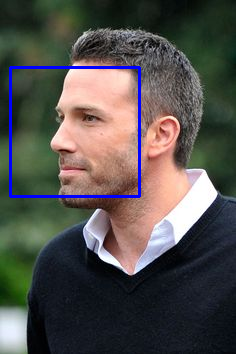

[(36, 230, 222, 56)]


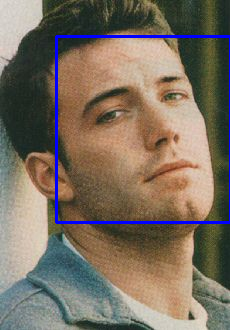

[(82, 182, 211, 53)]


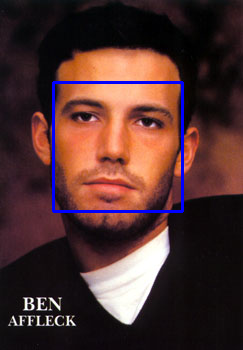

[(39, 114, 101, 52)]


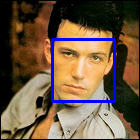

[]


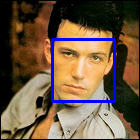

[(31, 112, 74, 69)]


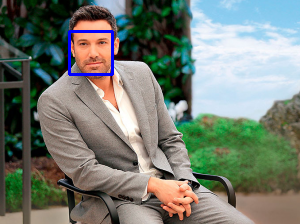

[(46, 116, 136, 26)]


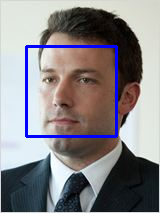

[(18, 141, 54, 105)]


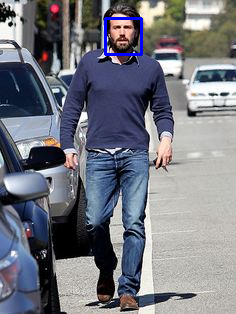

jerry_seinfeld
[(49, 158, 101, 106)]


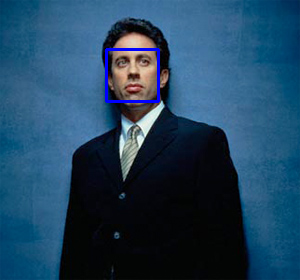

[(38, 204, 113, 129)]


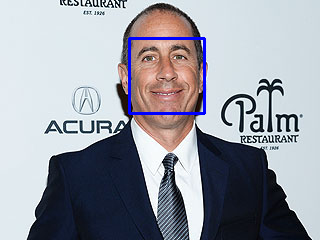

[(46, 135, 136, 46)]


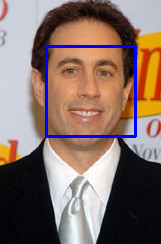

[(76, 165, 166, 76)]


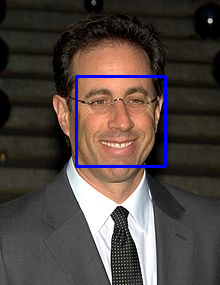

[(47, 218, 202, 64)]


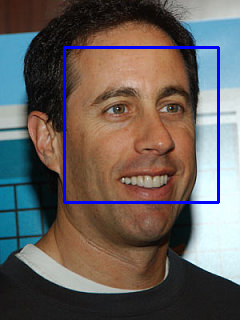

[(39, 149, 101, 87)]


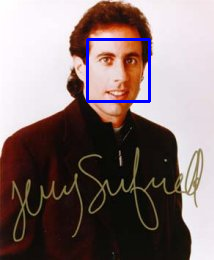

[(38, 146, 113, 71)]


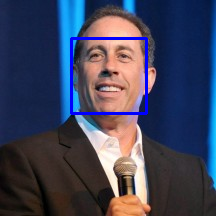

[(44, 211, 152, 103)]


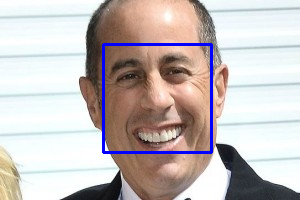

[(67, 210, 196, 81)]


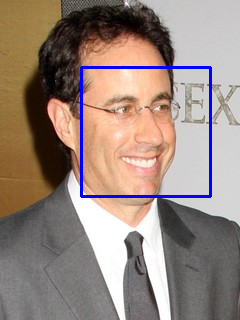

[(76, 145, 166, 56)]


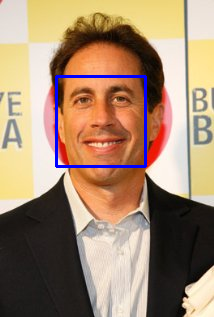

[(82, 210, 211, 81)]


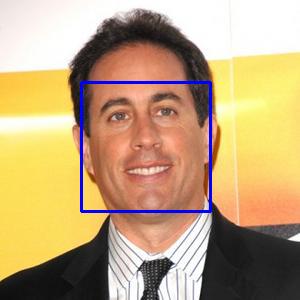

[(8, 223, 116, 115)]


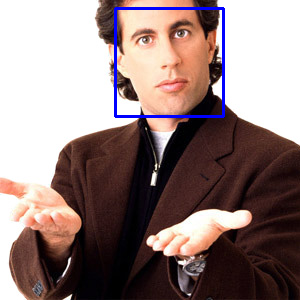

[(38, 88, 113, 13)]


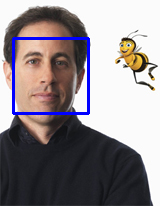

[(46, 170, 108, 107)]


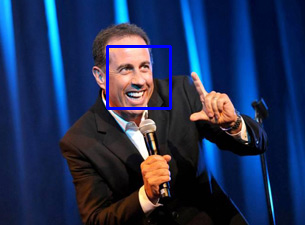

[(80, 151, 187, 44)]


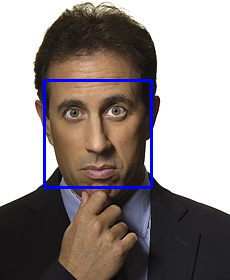

[(18, 142, 80, 80)]


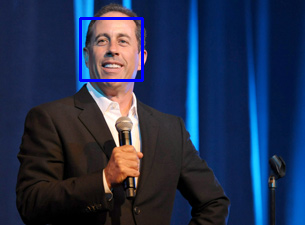

[(46, 135, 136, 46)]


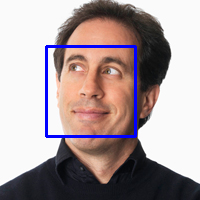

[(34, 109, 70, 73), (74, 217, 110, 181)]


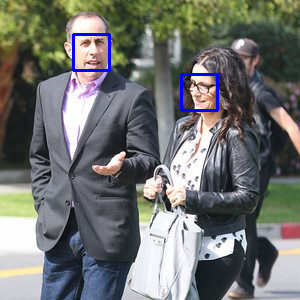

[(53, 121, 115, 59)]


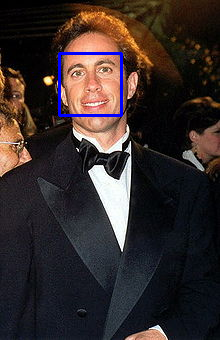

[(67, 196, 196, 67)]


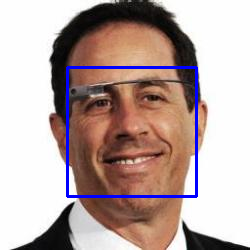

[(92, 163, 199, 55)]


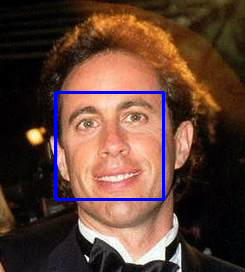

madonna
[(46, 121, 108, 59)]


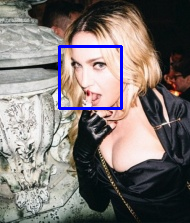

[(105, 146, 179, 71)]


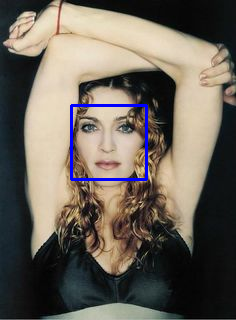

[(44, 163, 152, 55)]


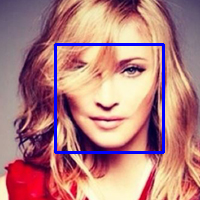

[(86, 155, 176, 66)]


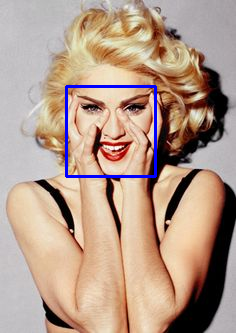

[(66, 145, 156, 56)]


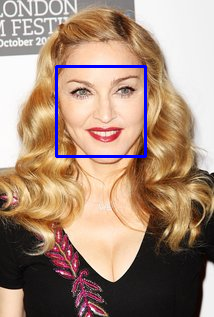

[(36, 165, 126, 76)]


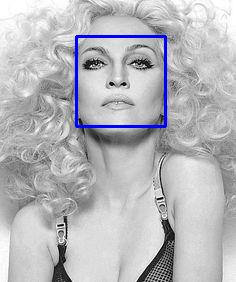

[(66, 107, 129, 45)]


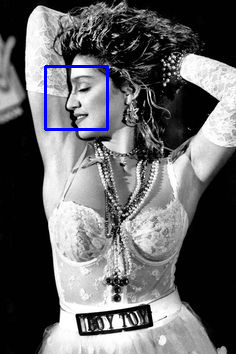

[(92, 163, 199, 55)]


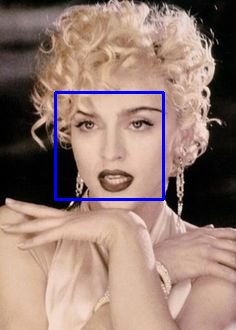

[(76, 165, 166, 76)]


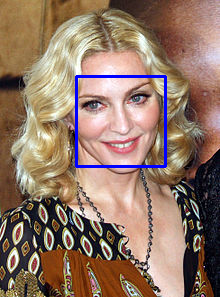

[(81, 201, 236, 46)]


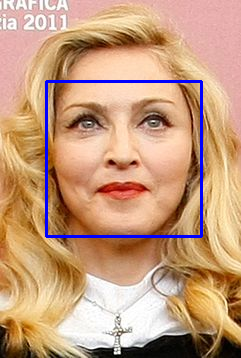

[]


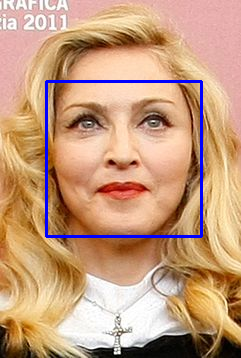

[(22, 162, 96, 88)]


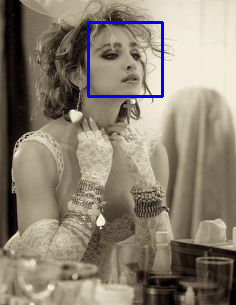

[(80, 187, 187, 79)]


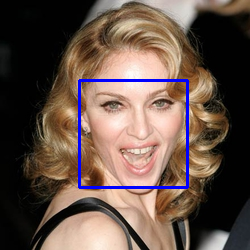

[(63, 179, 138, 104)]


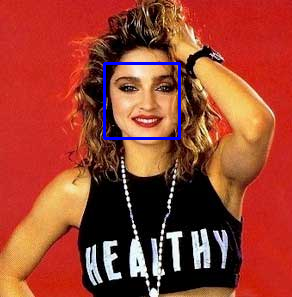

[(46, 197, 108, 135)]


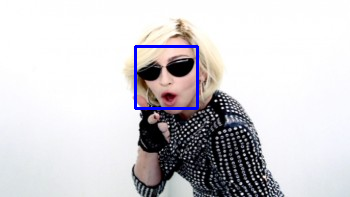

[(32, 106, 84, 55)]


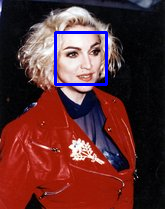

[(55, 164, 107, 112)]


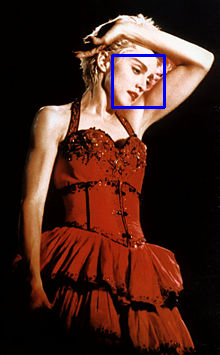

[(46, 84, 89, 40)]


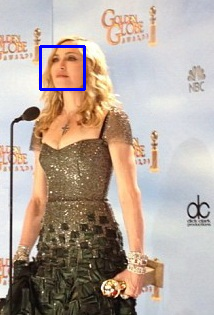

[(82, 182, 211, 53)]


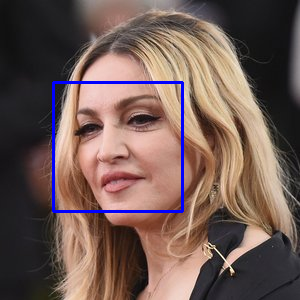

In [4]:
train_dir= "/content/train"
x1=0
y1=0
x2=0
y2=0
data= []
for folders in os.listdir(train_dir):
  print(folders)
  folders_dir= train_dir+ "/" + folders
  for folder in os.listdir(folders_dir):
    image_path= folders_dir + "/" + folder
    img= cv2.imread(image_path)
    gray_img= cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # print(image_path)
    f_img= face_recognition.load_image_file(image_path)
    # cv2_imshow(f_img)
    boxes= face_recognition.face_locations(f_img)
    print(boxes)
    for index, vals in enumerate(boxes):
      y1= vals[0]
      x2= vals[1]
      y2= vals[2]
      x1= vals[3]
      face_img= cv2.rectangle(img, (x1, y1), (x2, y2), (255,0,0), 2)
    cv2_imshow(face_img)
    encodings= face_recognition.face_encodings(f_img, boxes)

    d=[{"ImagePath": image_path, "location": box, "encoding": enc}
        for (box, enc) in zip(boxes, encodings)]
    data.extend(d)
  

In [5]:
encodings= [d["encoding"] for d in data]
type(encodings)

list

In [6]:
from sklearn.cluster import DBSCAN

clt= DBSCAN(eps= 0.6, min_samples= 10, metric= 'euclidean')

In [7]:
clt.fit(encodings)

DBSCAN(eps=0.6, min_samples=10)

In [8]:
lab= clt.labels_
print(lab)

[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  2  2  2  2  2  2  2  2  2  2  2  2
  2  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3 -1  3  3  3  4
  4  4  4  4  4 -1  4  4  4  4  4  4  4  4  4  4  4]


In [9]:
labels= np.unique(clt.labels_)
numUniqueFaces = len(np.where(labels > -1)[0])
print(numUniqueFaces)

5


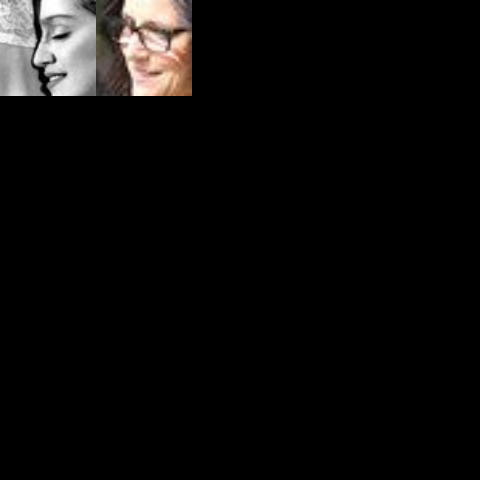

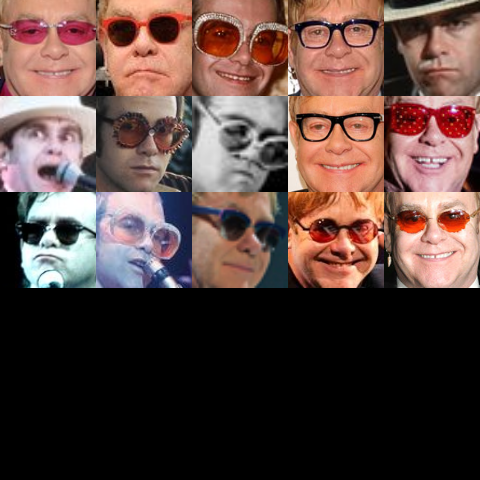

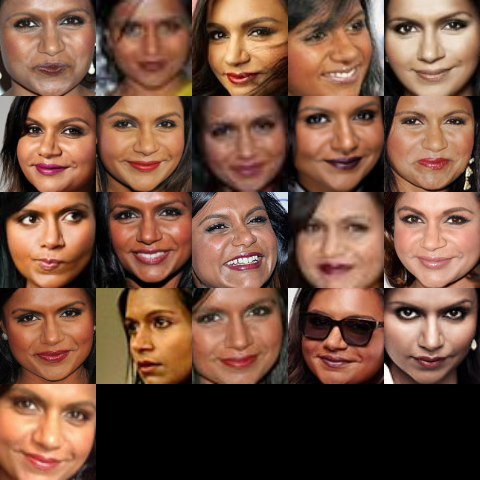

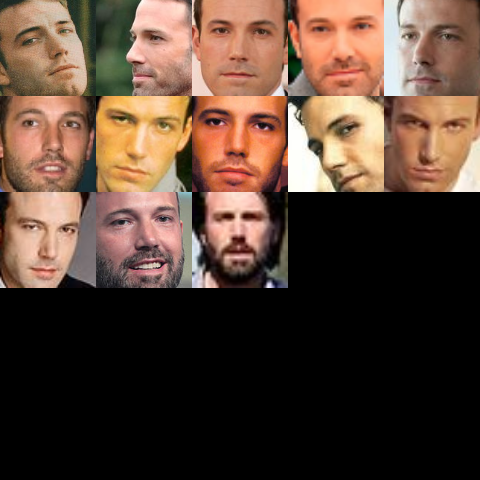

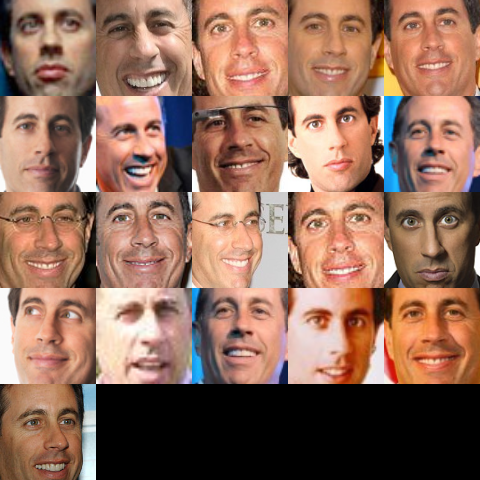

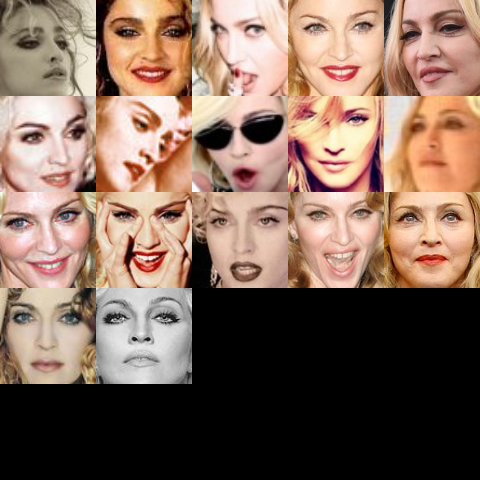

In [10]:
for label in labels:
  id= np.where(lab== label)[0]
  id= np.random.choice(id, size= min(25, len(id)), replace= False)
  faces= []
  for i in id:
    image = cv2.imread(data[i]["ImagePath"])
    (top, right, bottom, left)= data[i]["location"]
    face= image[top:bottom, left:right]
    face = cv2.resize(face, (96, 96))
    faces.append(face)
  montage= build_montages(faces, (96,96), (5,5))[0]
  cv2_imshow(montage)

In [12]:
cv2.imwrite("Result.jpg", montage)

True